# BBx Data Report

In [99]:
%pylab inline


import os, glob
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

import subprocess as sp
import ipywidgets as widgets

from nilearn import plotting
from nilearn import image
from IPython.display import display, SVG
from IPython.html.widgets import interactive

plt.rcParams["figure.figsize"] = (60,40)


Populating the interactive namespace from numpy and matplotlib


/projects/niblab/modules/software/miniconda3/miniconda3/lib/python3.7/site-packages/IPython/core/magics/pylab.py:160: UserWarning: pylab import has clobbered these variables: ['plotting', 'interactive']
`%matplotlib` prevents importing * from pylab and numpy
  "\n`%matplotlib` prevents importing * from pylab and numpy"


In [100]:
remove_subs=['sub-029', 'sub-047', 'sub-049', 'sub-069', 'sub-081', 'sub-094', 'sub-101',
             'sub-105', 'sub-106', 'sub-110', 'sub-113', 'sub-122', 'sub-125', 'sub-126', 
             'sub-139', 'sub-155', 'sub-158', 'sub-165']

s2_drop_subjects=["sub-003", 'sub-012','sub-016', 'sub-018',  "sub-020", "sub-024", "sub-025",'sub-026', 'sub-035',
                  "sub-052", 'sub-056', "sub-059", "sub-060", "sub-064","sub-074", "sub-076", "sub-077", 'sub-087',
                  'sub-108', "sub-147", "sub-150", "sub-167"]

## BIDS <a class='anchor' id='bids'></a>

In [101]:
"""
# Build BIDS Report 

"""

def anat_plot(plot_filename, anat_img):
    # get anat file and save plot
    anat_plot=plotting.plot_anat(anat_img, title="%s_%s"%(subject,session),
         display_mode='ortho', dim=-1, draw_cross=False,
        annotate=False, output_file=plot_filename)

def plot_functionals(func_file):
    # Compute the voxel_wise mean of functional images across time.
    # Basically reducing the functional image from 4D to 3D
    mean_img = image.mean_img(func_file)
    filename=func_file.split("/")[-1].split(".")[0]

    plot_filename = os.path.join(report_folder_path,
                                   "%s_mean_img.png"%filename)            
            
    plot_img=plotting.plot_epi(mean_img, title=filename,
        display_mode='ortho', draw_cross=False,
        annotate=False, output_file=plot_filename)
          


def build_bids_report(write_files=False):
    
    
    print('[INFO] bids data folder: %s'%bids_data_path)
    #excel_file=os.path.join(report_folder_path, "bbx_preprocessing_report.xlsx")
    sessions=['ses-1', 'ses-2']
    dataframes=[]
    #writer = pd.ExcelWriter(excel_file, engine = 'xlsxwriter')
    logfile=open('/projects/niblab/experiments/bbx/data/quality_analysis/bad_volumes.log', 'a+')
    # loop through sessions
    for session in sessions:
        #print("\n[INFO] %s"%session)

        data_dict={} #initialize data dictionary for session

        # loop through subject set by subject
        for i in range(1,171):
            subject="sub-%s"%f'{i:03}'
            bids_folder=os.path.join(bids_data_path, subject,
                                    session)

           
            if subject not in data_dict:
                data_dict[subject] = {}

                
            #--
            # get anat file
            
            anat_imgs =glob.glob(os.path.join(bids_folder, "anat",
                   '%s_%s_T1w.nii.gz'%(subject, session)))

            #if os.path.exists(anat_img): 
                #plot_filename=os.path.join(report_folder_path, "%s_%s_anat.png"%(subject,session))
            data_dict[subject]["anat_file_ct"]=len(anat_imgs)
            #anat_plot(plot_filename, anat_img) #plot image

            # get fmap files
            
            fmap_magn_imgs =glob.glob(os.path.join(bids_folder, "fmap",
                   '%s_%s_magnitude[0-9].nii.gz'%(subject, session)))
            
            data_dict[subject]["fmap_magnitude_file_ct"]=len(fmap_magn_imgs)

            fmap_phase_imgs =glob.glob(os.path.join(bids_folder, "fmap",
                   '%s_%s_phasediff.nii.gz'%(subject, session)))
            data_dict[subject]["fmap_phasediff_file_ct"]=len(fmap_phase_imgs)

            
            # ---
            
            # get functional files and check their volume and plot images

            func_files=glob.glob(os.path.join(
                    bids_folder, "func/*.nii.gz" ))

            # --initialize variables --
            train_ct=0
            rest_ct=0
            if session == 'ses-2':
                rl_ct=0
            for func_file in func_files:
                task=func_file.split("/")[-1].split("_")[2]
                vol = sp.check_output(["fslnvols", func_file])
                vol=str(vol,'utf-8').strip("\n")

                if "resting" in task:
                    rest_ct+=1
                    var_name="%s_vol"%task
                    data_dict[subject][var_name]=vol
                    if vol != '212':
                        logfile.write("bad volume for %s %s %")
                    
                elif "rl" in task:
                    rl_ct+=1
                    run=func_file.split("/")[-1].split("_")[3]
                    var_name="%s_%s_vol"%(task,run)
                    data_dict[subject][var_name]=vol
                    
                elif "training" in task:
                    train_ct+=1
                    run=func_file.split("/")[-1].split("_")[3]
                    var_name="%s_%s_vol"%(task,run)
                    data_dict[subject][var_name]=vol
                    

            if session == 'ses-2':
                data_dict[subject]["rl_file_ct"]=rl_ct
            data_dict[subject]["train_file_ct"]=train_ct
            data_dict[subject]["rest_file_ct"]=rest_ct
            
        dataframe=pd.DataFrame(data_dict).T
        #dataframe.to_excel(writer, sheet_name="%s_bids"%session, index=False, header=False)
        dataframes.append(dataframe)
    print('[INFO] report building complete.')
    return dataframes;



In [102]:
"""
# BIDS Variables
"""
data_path='/projects/niblab/experiments/bbx/data'
bids_data_path=os.path.join(data_path, "bids/bids")
report_folder_path=os.path.join(data_path, 'quality_analysis')
bids_folders=glob.glob(os.path.join(bids_data_path, "sub-*/ses-*"))
bids_ses1=[x for x in bids_folders if 'ses-1' in x]
bids_ses2=[x for x in bids_folders if 'ses-2' in x]



### Getting data reports for the trimmed data

In [103]:
# build data report 
# -- if write_files=True, it will write out the report to an excel file
bids_data_path=os.path.join(data_path, "bids/bids_trimmed")
dataframes_orig=build_bids_report(write_files=False)

[INFO] bids data folder: /projects/niblab/experiments/bbx/data/bids/bids_trimmed
[INFO] report building complete.


In [104]:
s1_bids_df=dataframes_orig[0]
s1_bids_df.index.name = "patID"
s1_bids_df.drop(remove_subs, inplace=True)

s2_bids_df=dataframes_orig[1]
s2_bids_df.index.name = "patID"
s2_bids_df.drop(remove_subs+s2_drop_subjects, inplace=True)

### How many subjects found for session-2 ?

In [105]:
len(s2_bids_df.index.values)

130

### What are the IDS found for session-2?

In [106]:
s2_bids_df.index.values

array(['sub-001', 'sub-002', 'sub-004', 'sub-005', 'sub-006', 'sub-007',
       'sub-008', 'sub-009', 'sub-010', 'sub-011', 'sub-013', 'sub-014',
       'sub-015', 'sub-017', 'sub-019', 'sub-021', 'sub-022', 'sub-023',
       'sub-027', 'sub-028', 'sub-030', 'sub-031', 'sub-032', 'sub-033',
       'sub-034', 'sub-036', 'sub-037', 'sub-038', 'sub-039', 'sub-040',
       'sub-041', 'sub-042', 'sub-043', 'sub-044', 'sub-045', 'sub-046',
       'sub-048', 'sub-050', 'sub-051', 'sub-053', 'sub-054', 'sub-055',
       'sub-057', 'sub-058', 'sub-061', 'sub-062', 'sub-063', 'sub-065',
       'sub-066', 'sub-067', 'sub-068', 'sub-070', 'sub-071', 'sub-072',
       'sub-073', 'sub-075', 'sub-078', 'sub-079', 'sub-080', 'sub-082',
       'sub-083', 'sub-084', 'sub-085', 'sub-086', 'sub-088', 'sub-089',
       'sub-090', 'sub-091', 'sub-092', 'sub-093', 'sub-095', 'sub-096',
       'sub-097', 'sub-098', 'sub-099', 'sub-100', 'sub-102', 'sub-103',
       'sub-104', 'sub-107', 'sub-109', 'sub-111', 

### What are the subjects with missing files? 

In [107]:
s2_bids_df[s2_bids_df.isna().any(axis=1)].style.highlight_null('red')

,anat_file_ct,fmap_magnitude_file_ct,fmap_phasediff_file_ct,task-resting_vol,task-training_run-1_vol,task-training_run-2_vol,task-training_run-3_vol,task-training_run-4_vol,task-rl_run-1_vol,task-rl_run-2_vol,rl_file_ct,train_file_ct,rest_file_ct
patID,,,,,,,,,,,,,
sub-010,1,2,1,nan,229,229,229,229,212,212,2,4,0
sub-015,1,2,1,147,229,229,229,229,212,nan,1,4,1
sub-021,1,2,1,147,229,229,229,229,212,nan,1,4,1
sub-023,1,2,1,147,229,229,229,229,212,nan,1,4,1
sub-037,1,2,1,147,229,229,229,229,nan,nan,0,4,1
sub-044,1,2,1,nan,229,229,229,229,212,212,2,4,0
sub-058,1,2,1,147,229,229,229,nan,212,212,2,3,1
sub-071,1,2,1,147,229,229,229,229,212,nan,1,4,1
sub-088,1,2,1,147,229,229,229,229,212,nan,1,4,1


### Missing Training Task Files

In [108]:
s2_bids_df[s2_bids_df['train_file_ct'] < 4].filter(like='train')

,task-training_run-1_vol,task-training_run-2_vol,task-training_run-3_vol,task-training_run-4_vol,train_file_ct
patID,,,,,
sub-058,229,229,229,NaN,3
sub-091,233,NaN,233,233,3


In [109]:
s2_bids_df[s2_bids_df['train_file_ct'] < 4].filter(like='train').index.values

array(['sub-058', 'sub-091'], dtype=object)

### Missing Resting File:

In [110]:
s2_bids_df[s2_bids_df['rest_file_ct'] < 1 ].filter(like='rest')

,task-resting_vol,rest_file_ct
patID,,
sub-010,NaN,0
sub-044,NaN,0


In [111]:
s2_bids_df[s2_bids_df['rest_file_ct'] < 1 ].filter(like='rest').index.values

array(['sub-010', 'sub-044'], dtype=object)

### Missing RL Task Files:

In [112]:
s2_bids_df[s2_bids_df['rl_file_ct'] < 2 ].filter(like='rl')

,task-rl_run-1_vol,task-rl_run-2_vol,rl_file_ct
patID,,,
sub-015,212,NaN,1
sub-021,212,NaN,1
sub-023,212,NaN,1
sub-037,NaN,NaN,0
sub-071,212,NaN,1
sub-088,212,NaN,1
sub-146,212,NaN,1


In [113]:
s2_bids_df[s2_bids_df['rl_file_ct'] < 2 ].filter(like='rl').index.values

array(['sub-015', 'sub-021', 'sub-023', 'sub-037', 'sub-071', 'sub-088',
       'sub-146'], dtype=object)

---
---

## fMRIPREP <a class='anchor' id='fmriprep'></a>  


Path on RENCI: `/projects/niblab/experiments/bbx/data/fmriprep`  

Quick fmriprep report found here: `/projects/niblab/experiments/bbx/data/code/fmriprep_notebook.ipynb `

In [114]:

    
    
"""
# Build FMRIPREP Report 

"""


def build_fmriprep_report(write_files=False):
    
    print('[INFO] fmriprep data path: %s '%fmriprep_path)

    sessions=['ses-1', 'ses-2']
    dataframes=[]
        
    # loop through sessions
    for session in sessions:
        #print("\n[INFO] %s"%session)
        

        data_dict={} #initialize data dictionary for session

        # loop through subject set by subject
        for i in range(1,171):
            train_ct=0
            rest_ct=0
            if session == 'ses-2':
                rl_ct=0
            subject="sub-%s"%f'{i:03}'
            bids_folder=os.path.join(fmriprep_path, subject,
                                    session)

            if subject not in data_dict:
                data_dict[subject] = {}


        
            # get anat file and save plot
            #_space-MNI152NLin2009cAsym_desc-preproc_T1w.nii.g
            anat_imgs =glob.glob(os.path.join(fmriprep_path, subject, "anat",
                   '%s_space-MNI152NLin2009cAsym_desc-preproc_T1w.nii.gz'%(subject)))

            #if os.path.exists(anat_img): 
            data_dict[subject]["anat_file_ct"]=len(anat_imgs)

            # get functional files and check their volume and plot images
            func_files=glob.glob(os.path.join(
                    fmriprep_path, subject, session,
                    "func/*task-*_space-MNI152NLin2009cAsym_desc-preproc_bold.nii.gz" ))

            for func_file in func_files:
                
                task=func_file.split("/")[-1].split("_")[2]
                vol = sp.check_output(["fslnvols", func_file])
                vol=str(vol,'utf-8').strip("\n")


                if "resting" in task:
                    rest_ct+=1
                    var_name="%s_vol"%task
                    data_dict[subject][var_name]=vol
                elif "rl" in task:
                    rl_ct+=1
                    run=func_file.split("/")[-1].split("_")[3]
                    var_name="%s_%s_vol"%(task,run)
                    data_dict[subject][var_name]=vol
                elif "training" in task:
                    train_ct+=1
                    run=func_file.split("/")[-1].split("_")[3]
                    var_name="%s_%s_vol"%(task,run)
                    data_dict[subject][var_name]=vol

            if session == 'ses-2':
                data_dict[subject]["rl_file_ct"]=rl_ct
            data_dict[subject]["train_file_ct"]=train_ct
            data_dict[subject]["rest_file_ct"]=rest_ct
            # plot functionals
            #pool = Pool()
            #pool.map(plot_functionals, func_files)
            #pool.close()

        dataframe=pd.DataFrame(data_dict).T        
        dataframes.append(dataframe)
        #dataframe.to_excel(writer, sheet_name="%s_fmriprep"%session)
    #writer.save()
    #writer.close()
    return dataframes;


### Load fMRIPREP reports

In [115]:
fmriprep_dict={}

# PASS IN VARIABLES 
# Variable load and setup
fmriprep_path='/projects/niblab/experiments/bbx/data/fmriprep/fmriprep_trimmed-20.2.0'
#'/projects/niblab/experiments/bbx/data/fmriprep/fmriprep_trimmed'

# get data report
dataframes=build_fmriprep_report(write_files=False)

[INFO] fmriprep data path: /projects/niblab/experiments/bbx/data/fmriprep/fmriprep_trimmed-20.2.0 


In [116]:
s1_fmriprep_df=dataframes[0]
s1_fmriprep_df.index.name = "patID"
s1_fmriprep_df.drop(remove_subs, inplace=True)
s2_fmriprep_df=dataframes[1] 
s2_fmriprep_df.drop(remove_subs+s2_drop_subjects, inplace=True)
s2_fmriprep_df.index.name = "patID"

## Session-1

### How many subjects are found for ses-1?

In [117]:
len(s1_fmriprep_df.index.values)

152

In [118]:
len(s1_fmriprep_df[s1_fmriprep_df.isna().any(axis=1)].index.values)

12

### How many subjects have no missing data for ses-1?

In [119]:
len(s1_fmriprep_df[s1_fmriprep_df.notna().any(axis=1)])

152

### Subjects with missing data for ses-1

In [120]:
s1_fmriprep_df[s1_fmriprep_df.isna().any(axis=1)].style.highlight_null('red')

,anat_file_ct,task-training_run-4_vol,task-training_run-3_vol,task-training_run-2_vol,task-training_run-1_vol,task-resting_vol,train_file_ct,rest_file_ct
patID,,,,,,,,
sub-016,0.000000,nan,nan,nan,nan,nan,0.000000,0.000000
sub-027,0.000000,nan,nan,nan,nan,nan,0.000000,0.000000
sub-048,1,nan,229,229,229,147,3,1
sub-059,0.000000,nan,nan,nan,nan,nan,0.000000,0.000000
sub-060,0,nan,nan,229,229,nan,2,0
sub-073,1,nan,229,229,229,147,3,1
sub-074,0.000000,nan,nan,nan,nan,nan,0.000000,0.000000
sub-076,0,nan,229,229,229,nan,3,0
sub-108,0.000000,nan,nan,nan,nan,nan,0.000000,0.000000


## Session-2

In [121]:
# these subjects have missing files, but are not dropped from the study, further details in scan notes 
expected_missing_files=['sub-010', 'sub-044', 'sub-015', 'sub-021', 
                        'sub-023', 'sub-037', 'sub-058', 'sub-071', 'sub-088', 'sub-146']

### How many subjects are found for ses-2?

In [122]:
len(s2_fmriprep_df.index.values)

130

### How many subjects have missing data for ses-2?

In [123]:
len(s2_fmriprep_df[s2_fmriprep_df.isna().any(axis=1)].index.values)

12

### How many subjects have no missing data for ses-2?

In [124]:
len(s2_fmriprep_df[s2_fmriprep_df.notna().all(axis=1)].index.values)

118

In [125]:
s2_fmriprep_df[s2_fmriprep_df.notna().all(axis=1)].index.values

array(['sub-001', 'sub-002', 'sub-004', 'sub-005', 'sub-006', 'sub-007',
       'sub-008', 'sub-009', 'sub-011', 'sub-013', 'sub-014', 'sub-017',
       'sub-019', 'sub-022', 'sub-028', 'sub-030', 'sub-031', 'sub-032',
       'sub-033', 'sub-034', 'sub-036', 'sub-038', 'sub-039', 'sub-040',
       'sub-041', 'sub-042', 'sub-043', 'sub-045', 'sub-046', 'sub-048',
       'sub-050', 'sub-051', 'sub-053', 'sub-054', 'sub-055', 'sub-057',
       'sub-061', 'sub-062', 'sub-063', 'sub-065', 'sub-066', 'sub-067',
       'sub-068', 'sub-070', 'sub-072', 'sub-073', 'sub-075', 'sub-078',
       'sub-079', 'sub-080', 'sub-082', 'sub-083', 'sub-084', 'sub-085',
       'sub-086', 'sub-089', 'sub-090', 'sub-092', 'sub-093', 'sub-095',
       'sub-096', 'sub-097', 'sub-098', 'sub-099', 'sub-100', 'sub-102',
       'sub-103', 'sub-104', 'sub-107', 'sub-109', 'sub-111', 'sub-112',
       'sub-114', 'sub-115', 'sub-116', 'sub-117', 'sub-118', 'sub-119',
       'sub-120', 'sub-121', 'sub-123', 'sub-124', 

## Subjects with missing data for ses-2

In [126]:
s2_fmriprep_mia=list(s2_fmriprep_df[s2_fmriprep_df.isna().any(axis=1)].index.values)

In [127]:
[x for x in s2_fmriprep_mia if x not in expected_missing_files]

['sub-027', 'sub-091']

In [128]:
s2_fmriprep_df.loc[[x for x in s2_fmriprep_mia if x not in expected_missing_files],:].style.highlight_null('red')

,anat_file_ct,task-training_run-4_vol,task-training_run-3_vol,task-training_run-2_vol,task-training_run-1_vol,task-rl_run-2_vol,task-rl_run-1_vol,task-resting_vol,rl_file_ct,train_file_ct,rest_file_ct
patID,,,,,,,,,,,
sub-027,0.000000,nan,nan,nan,nan,nan,nan,nan,0.000000,0.000000,0.000000
sub-091,0.000000,nan,nan,nan,nan,nan,nan,nan,0.000000,0.000000,0.000000


In [129]:
s2_fmriprep_df[s2_fmriprep_df.isna().any(axis=1)].style.highlight_null('red')

,anat_file_ct,task-training_run-4_vol,task-training_run-3_vol,task-training_run-2_vol,task-training_run-1_vol,task-rl_run-2_vol,task-rl_run-1_vol,task-resting_vol,rl_file_ct,train_file_ct,rest_file_ct
patID,,,,,,,,,,,
sub-010,1,229,229,229,229,212,212,nan,2,4,0
sub-015,1,229,229,229,229,nan,212,147,1,4,1
sub-021,1,229,229,229,229,nan,212,147,1,4,1
sub-023,1,229,229,229,229,nan,212,147,1,4,1
sub-027,0.000000,nan,nan,nan,nan,nan,nan,nan,0.000000,0.000000,0.000000
sub-037,1,229,229,229,229,nan,nan,147,0,4,1
sub-044,1,229,229,229,229,212,212,nan,2,4,0
sub-058,1,nan,229,229,229,212,212,147,2,3,1
sub-071,1,229,229,229,229,nan,212,147,1,4,1


---  
--- 

**Visualizations**

In [130]:
# Import image processing tool
from nilearn import image


In [131]:
func_sample='/projects/niblab/experiments/bbx/data/preprocessed/subs_trimmed/sub-002/ses-2/func/sub-002_ses-2_task-training_run-1_space-MNI152NLin2009cAsym_desc-preproc_bold_brain.nii.gz'


In [132]:
def plot_epi(func=func_sample):
    
    
    # Compute the voxel_wise mean of functional images across time.
    # Basically reducing the functional image from 4D to 3D
    mean_img = image.mean_img(func)
    
    sub=func.split("/")[-1].split("_")[0]
    ses=func.split("/")[-1].split("_")[1]
    task=func.split("/")[-1].split("_")[2]
    run=func.split("/")[-1].split("_")[3]
    
    
    title="%s %s %s %s bold file "%(sub, ses, task, run)
    
    # Visualizing mean image (3D)
    plotting.plot_epi(mean_img, title=title)
    plt.show()


In [133]:
funcs=glob.glob(os.path.join('/projects/niblab/experiments/bbx/data/preprocessed/subs_trimmed/sub-*/ses-2/func/*_run-1_space-MNI152NLin2009cAsym_desc-preproc_bold_brain.nii.gz'))
funcs.sort()

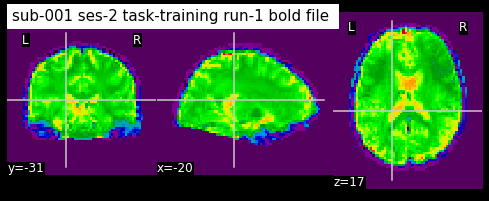

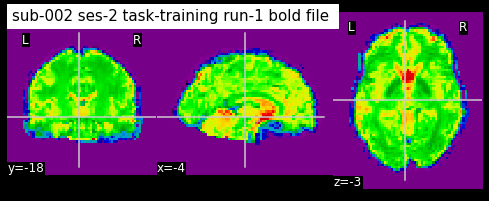

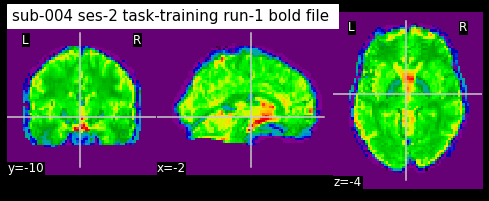

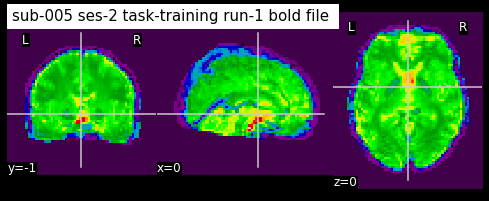

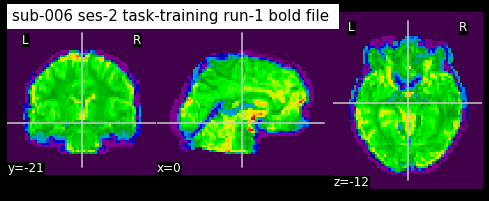

...

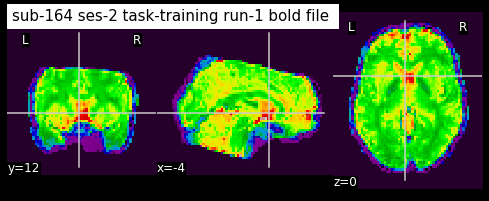

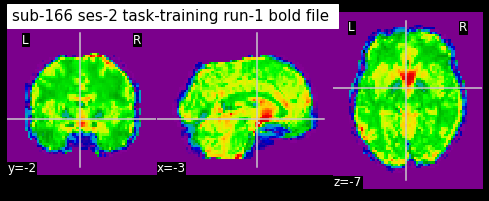

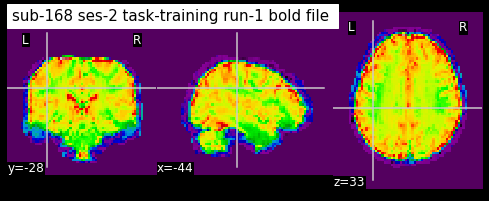

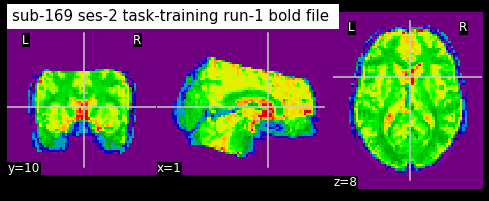

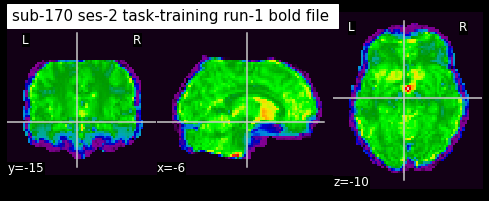

In [41]:
for func in funcs:
    plot_epi(func=func)

## The Grey Matter mask we apply

In [42]:
#anat=
mask='/projects/niblab/experiments/bbx/data/masks/BBX_GM152asym_mask_3x3x3_final_V3.nii.gz'

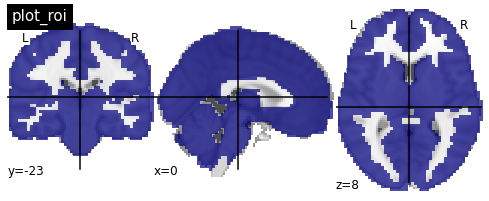

In [43]:
plotting.plot_roi(mask,
                  title="plot_roi")

---
---

### Plotting Regressors

In [89]:
fmriprep_path

'/projects/niblab/experiments/bbx/data/fmriprep/fmriprep_trimmed-20.2.0'

In [90]:

fd_col=['framewise_displacement']
acompcor_cols=['a_comp_cor_00', 'a_comp_cor_01', 'a_comp_cor_02',
    'a_comp_cor_03', 'a_comp_cor_04', 'a_comp_cor_05']
moco_cols = ['trans_x', 'trans_y', 'trans_z', 'rot_x', 'rot_y', 'rot_z']
mot_outliers=['motion_outlier00', 'motion_outlier01', 'motion_outlier02',
              'motion_outlier03','motion_outlier04', 'motion_outlier05']
#Get FD files

session='ses-2'

fmriprep_files=glob.glob(os.path.join(fmriprep_path, 'sub-*/%s/func/*training*confounds*.tsv'%session))
sub_ids=[x.split("/")[-2] for x in glob.glob(os.path.join(fmriprep_path, 'sub-*/ses-1'))]

fmriprep_files.sort()
sub_ids.sort()
print('run files ', len(fmriprep_files))
print('subjects  ', len(sub_ids))

print(sub_ids[:4])



run files  544
subjects   148
['sub-001', 'sub-002', 'sub-003', 'sub-004']


In [91]:
fmriprep_files[0]
testfile=fmriprep_files[0]
df=pd.read_csv(fmriprep_files[0], sep="\t")

In [92]:
df[['a_comp_cor_00', 'a_comp_cor_01', 'a_comp_cor_02',
    'a_comp_cor_03', 'a_comp_cor_04', 'a_comp_cor_05']].head()

,a_comp_cor_00,a_comp_cor_01,a_comp_cor_02,a_comp_cor_03,a_comp_cor_04,a_comp_cor_05
0,0.047793,0.007238,-0.054436,0.015264,-0.023830,0.088817
1,-0.034577,-0.057216,0.022519,0.011065,-0.089079,0.023420
2,-0.067988,0.037181,-0.000176,-0.010428,-0.041497,0.028800
3,-0.091543,0.043729,-0.053348,0.005432,-0.008293,0.067380
4,-0.056281,-0.033243,-0.018242,-0.002451,-0.010978,0.067976


---

In [93]:
svgs=glob.glob(os.path.join(fmriprep_path,
                 'sub-001/figures/sub-*_ses-2_task-training_run-1*.svg'))

In [94]:
svgs

['/projects/niblab/experiments/bbx/data/fmriprep/fmriprep_trimmed-20.2.0/sub-001/figures/sub-001_ses-2_task-training_run-1_desc-fieldmap_bold.svg',
 '/projects/niblab/experiments/bbx/data/fmriprep/fmriprep_trimmed-20.2.0/sub-001/figures/sub-001_ses-2_task-training_run-1_desc-flirtbbr_bold.svg',
 '/projects/niblab/experiments/bbx/data/fmriprep/fmriprep_trimmed-20.2.0/sub-001/figures/sub-001_ses-2_task-training_run-1_desc-sdc_bold.svg',
 '/projects/niblab/experiments/bbx/data/fmriprep/fmriprep_trimmed-20.2.0/sub-001/figures/sub-001_ses-2_task-training_run-1_desc-compcorvar_bold.svg',
 '/projects/niblab/experiments/bbx/data/fmriprep/fmriprep_trimmed-20.2.0/sub-001/figures/sub-001_ses-2_task-training_run-1_desc-rois_bold.svg',
 '/projects/niblab/experiments/bbx/data/fmriprep/fmriprep_trimmed-20.2.0/sub-001/figures/sub-001_ses-2_task-training_run-1_desc-confoundcorr_bold.svg',
 '/projects/niblab/experiments/bbx/data/fmriprep/fmriprep_trimmed-20.2.0/sub-001/figures/sub-001_ses-2_task-trainin

### SVG plots

In [95]:
['carpetplot', 'confoundcorr', 'rois', 'compcorvar', 'sdc', 'fieldmap' ]

['carpetplot', 'confoundcorr', 'rois', 'compcorvar', 'sdc', 'fieldmap']

In [140]:
def show_svg(svg):
    display(SVG(filename=svg))

In [147]:
def view_svgs(sub='sub-002', ses='ses-1', run='run-1', task='training'):
    svgs=glob.glob(os.path.join(fmriprep_path,
                 '%s/figures/%s_%s_task-%s_%s_*.svg'%(sub, sub, ses, task, run)))
    
    for svg in svgs:
        print('[FILE] > %s'%svg )
        show_svg(svg)

[FILE] > /projects/niblab/experiments/bbx/data/fmriprep/fmriprep_trimmed-20.2.0/sub-022/figures/sub-022_ses-2_task-training_run-2_desc-fieldmap_bold.svg


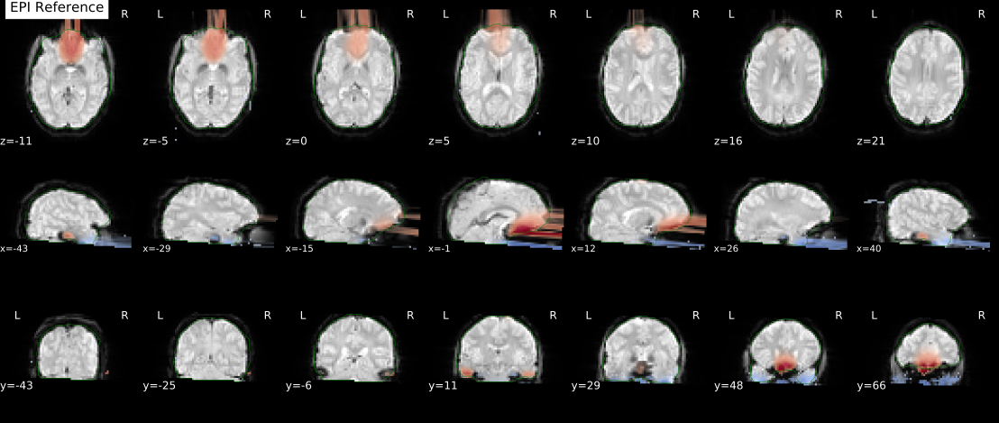

[FILE] > /projects/niblab/experiments/bbx/data/fmriprep/fmriprep_trimmed-20.2.0/sub-022/figures/sub-022_ses-2_task-training_run-2_desc-flirtbbr_bold.svg


[FILE] > /projects/niblab/experiments/bbx/data/fmriprep/fmriprep_trimmed-20.2.0/sub-022/figures/sub-022_ses-2_task-training_run-2_desc-sdc_bold.svg


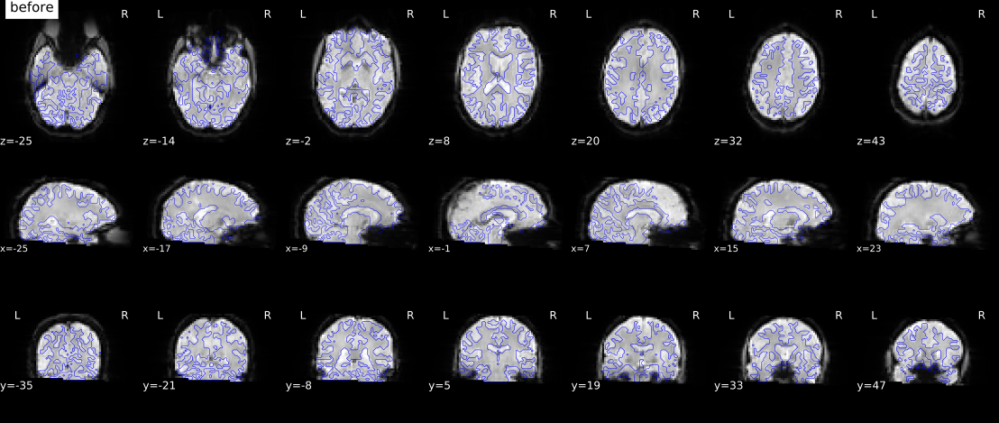

[FILE] > /projects/niblab/experiments/bbx/data/fmriprep/fmriprep_trimmed-20.2.0/sub-022/figures/sub-022_ses-2_task-training_run-2_desc-compcorvar_bold.svg


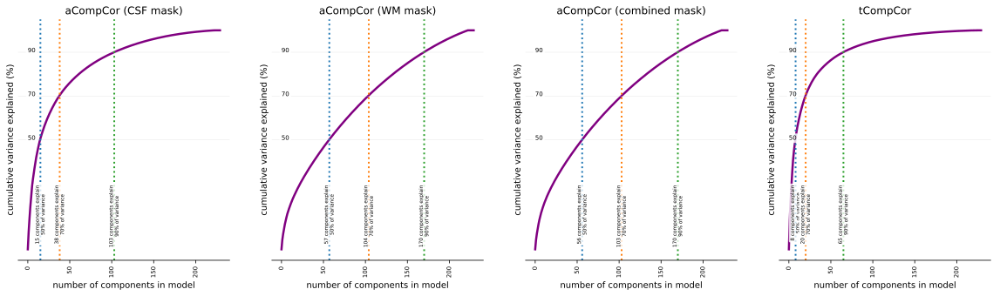

[FILE] > /projects/niblab/experiments/bbx/data/fmriprep/fmriprep_trimmed-20.2.0/sub-022/figures/sub-022_ses-2_task-training_run-2_desc-rois_bold.svg


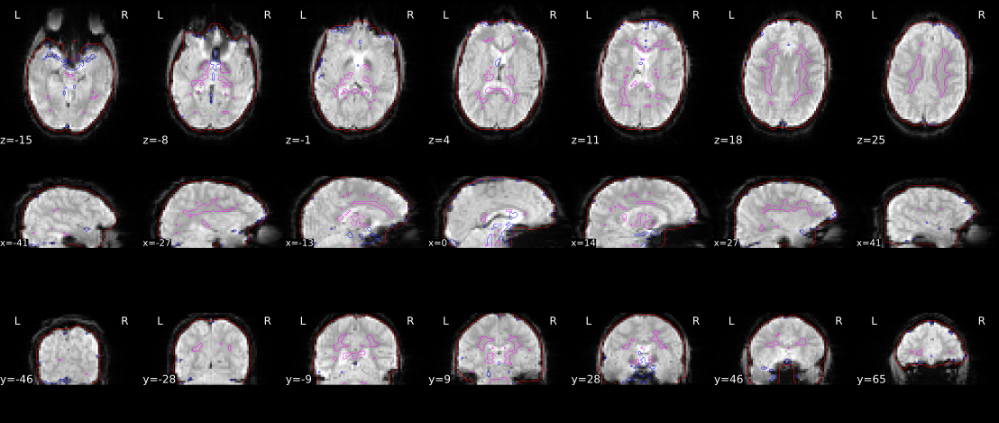

[FILE] > /projects/niblab/experiments/bbx/data/fmriprep/fmriprep_trimmed-20.2.0/sub-022/figures/sub-022_ses-2_task-training_run-2_desc-confoundcorr_bold.svg


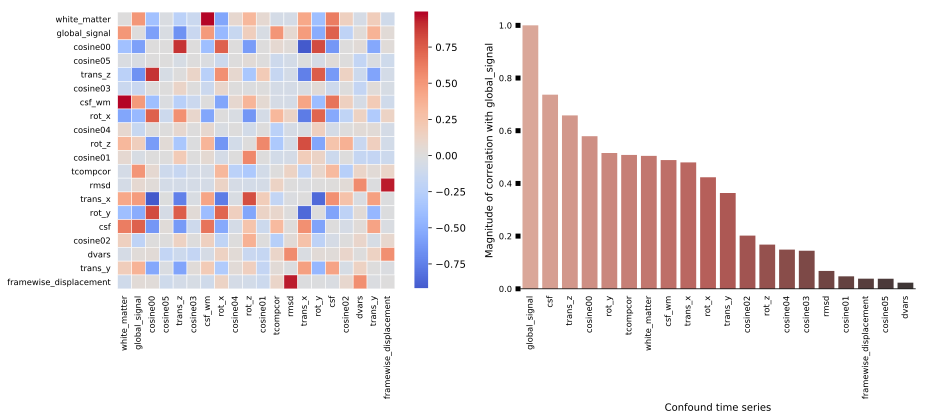

[FILE] > /projects/niblab/experiments/bbx/data/fmriprep/fmriprep_trimmed-20.2.0/sub-022/figures/sub-022_ses-2_task-training_run-2_desc-carpetplot_bold.svg


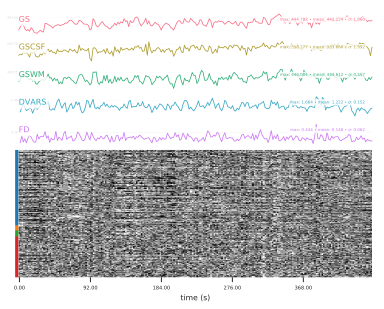

In [148]:
view_svgs(sub='sub-022', ses='ses-2', run='run-2', task='training')

`singularity exec -B /projects/niblab/bids_projects:/base_dir -B /projects/niblab/bids_projects/mytemplateflowdir:/opt/templateflow /projects/niblab/bids_projects/Singularity_Containers/fmriprep_v2_2019.simg \
fmriprep /base_dir/Experiments/bbx/bids /base_dir/experiments/bbx/data/fmriprep \
    participant  \
    --participant-label ${id} \
    --skip_bids_validation \
    --fs-license-file /base_dir/freesurfer/license.txt \
    --fs-no-reconall \
    --longitudinal \
    --omp-nthreads 16 --n_cpus 16 \
    --ignore slicetiming \
    --bold2t1w-dof 12 --fd-spike-threshold 0.9 \
    --output-spaces MNI152NLin2009cAsym \
     -w /base_dir/experiments/bbx/data/fmriprep/fmriprep_wf \
     --resource-monitor --stop-on-first-crash`

In [194]:
def regressor_plots(subject='sub-001',session='ses-1',run="run-1"):

    plt.figure()
    tsv=data_dict[subject][session][run+"_confound_tsv"]
    #tsv=os.path.join("/projects/niblab/experiments/bbx/data/fmriprep/{}/ses-1/func/{}_ses-1_task-training_{}_desc-confounds_regressors.tsv".format(subject, subject, run))
    tsv_df = pd.read_csv(tsv, sep='\t')
    tsv_df.rename_axis("time(s)", inplace=True)
    spikes=[]
    markers_on = []
    
    confoundcorr_svg='/projects/niblab/experiments/bbx/data/fmriprep_data/fmriprep_trimmed/%s/ses-1/figures/%s_ses-1_task-training_%s_desc-confoundcorr_bold.svg'%(subject,subject, run) 
    carpetplot='/projects/niblab/experiments/bbx/data/fmriprep_data/fmriprep_trimmed/%s/ses-1/figures/%s_ses-1_task-training_%s_desc-carpetplot_bold.svg'%(subject,subject, run) 
    compcorvar='/projects/niblab/experiments/bbx/data/fmriprep_data/fmriprep_trimmed/%s/ses-1/figures/%s_ses-1_task-training_%s_desc-compcorvar_bold.svg'%(subject,subject, run)

    for index,pt in tsv_df['framewise_displacement'].iteritems():
        if pt > 0.5:
            spikes.append((round(pt,2), index))

    spike_ct=len(spikes)

    
    try:
        show_svg(confoundcorr_svg)
        show_svg(carpetplot)
        show_svg(compcorvar)
    except:
        pass
    
    
    if spike_ct != 0:
        for x in spikes:
            markers_on.append(x[1])

    fig, ax = plt.subplots(ncols=2, nrows=2, figsize=(25,18))
    fig.subplots_adjust(hspace=.5)

    ax[1,0].axhline(y=0.5, color='black', linestyle='--')

    tsv_df.plot.line( y="trans_x", use_index=True, ax=ax[0,0])
    tsv_df.plot.line( y="trans_y", use_index=True, ax=ax[0,0])
    tsv_df.plot.line( y="trans_z", use_index=True, ax=ax[0,0])
    tsv_df.plot.line( y="rot_x", use_index=True, ax=ax[0,1])
    tsv_df.plot.line( y="rot_y", use_index=True, ax=ax[0,1])
    tsv_df.plot.line( y="rot_z", use_index=True, ax=ax[0,1])
    tsv_df.plot.line( y="framewise_displacement",marker='^',markerfacecolor='red',
                     markevery=markers_on, c="gray", use_index=True, ax=ax[1,0])

    for acompcor in acompcor_cols:
        tsv_df.plot.line( y=acompcor, use_index=True, ax=ax[1,1])


    #acompcor_df=tsv_df.loc[:,acompcor_cols]

    # Compute the correlation matrix
    #df_corr = acompcor_df.corr()

    # Generate a mask for the upper triangle
    #mask = np.triu(np.ones_like(df_corr, dtype=bool))
    # adjust mask and df
    #mask = mask[1:, :-1]
    #corr = df_corr.iloc[1:,:-1].copy()

    # Generate a custom diverging colormap
    #cmap = sns.diverging_palette(230, 20, as_cmap=True)
    #cmap = sns.diverging_palette(220, 20, as_cmap=True)

    # Draw the heatmap with the mask and correct aspect ratio
    #sns.heatmap(corr, mask=mask, annot=True, fmt=".2f", 
     #  linewidths=5, cmap=cmap, vmin=-1, vmax=1, cbar_kws={"shrink": .8}, square=True, ax=ax[1,1])

    ax[0,0].set_title("Translation")
    ax[0,1].set_title("Rotation")
    ax[1,0].set_title("Framewise Displacement")
    ax[1,1].set_title("aCompCor Regressors")   
    plt.show()


In [195]:

    
def setup_dict(data_dict, sub_ids):
    
    for sub in sub_ids:
        for session in ['ses-1', 'ses-2']:
            #print(sub)
            if sub not in data_dict:
                data_dict[sub] = {'ses-1':{}, 'ses-2':{}}

            for tsv in glob.glob(os.path.join(fmriprep_path, 
                    "{}/{}/func/{}_*confounds*.tsv*".format(sub,session, sub))):

                run=tsv.split('/')[-1].split("_")[3]
                data_dict[sub][session][run+"_confound_tsv"] = tsv

        
    return data_dict;
        

In [196]:

remove_subs=['sub-029', 'sub-047', 'sub-049', 'sub-069', 'sub-081', 'sub-094', 'sub-101',
             'sub-105', 'sub-106', 'sub-110', 'sub-113', 'sub-122', 'sub-125', 'sub-126', 
             'sub-139', 'sub-155', 'sub-158', 'sub-165']

s2_drop_subjects=["sub-003", 'sub-012','sub-016', 'sub-018',  "sub-020", "sub-024", "sub-025",'sub-026', 'sub-035',
                  "sub-052", 'sub-056', "sub-059", "sub-060", "sub-064","sub-074", "sub-076", "sub-077", 'sub-087',
                  'sub-108', "sub-147", "sub-150", "sub-167"]

fd_col=['framewise_displacement']
acompcor_cols=['a_comp_cor_00', 'a_comp_cor_01', 'a_comp_cor_02',
    'a_comp_cor_03', 'a_comp_cor_04', 'a_comp_cor_05']
moco_cols = ['trans_x', 'trans_y', 'trans_z', 'rot_x', 'rot_y', 'rot_z']
mot_outliers=['motion_outlier00', 'motion_outlier01', 'motion_outlier02',
              'motion_outlier03','motion_outlier04', 'motion_outlier05']



In [197]:
import seaborn as sns

data_dict={}
data_dict=setup_dict(data_dict, sub_ids)

<Figure size 4320x2880 with 0 Axes>

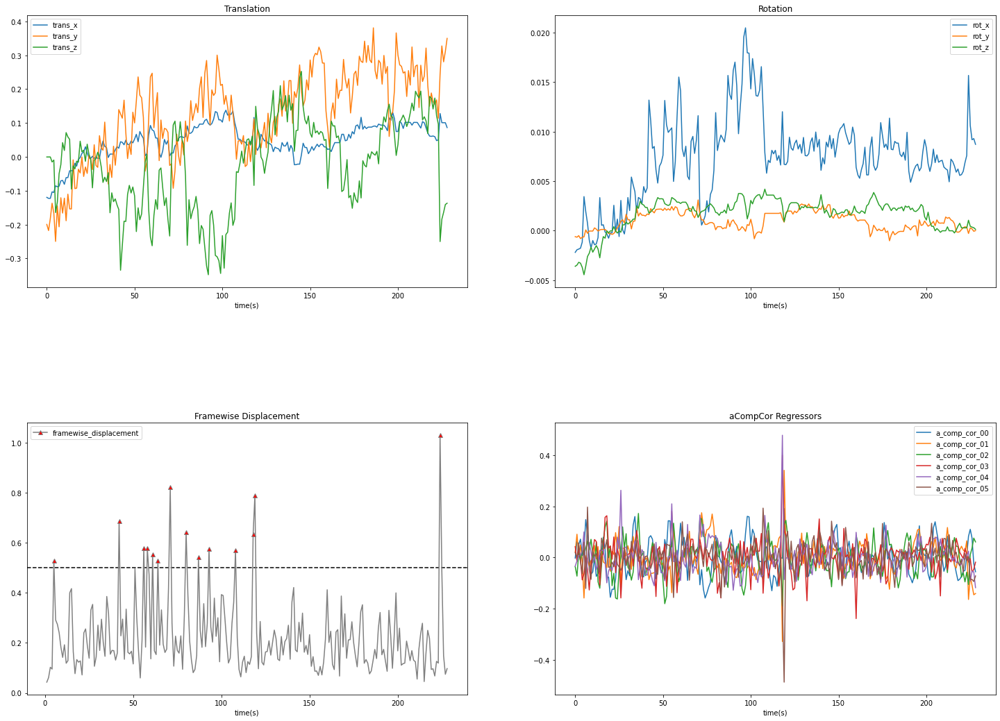

In [198]:
regressor_plots(subject='sub-021',session='ses-1',run="run-1")

## Preprocessed Data <a class='anchor' id='preproc'></a>  

Confound Plots: `/projects/niblab/experiments/bbx/data/code/Confound_Plots.ipynb`

Path on RENCI: `/projects/niblab/experiments/bbx/data/preprocessed`  



In [2]:
preproc_path='/projects/niblab/experiments/bbx/data/preprocessed'

### FSL Feat 1  <a class='anchor' id='feat1'></a>  

Quick report: `/projects/niblab/experiments/bbx/data/code/feat1_check.ipynb`


Design file: `/projects/niblab/experiments/bbx/data/code/design1.fsf`  
  
  

The variables with example paths   
  
  
**OUTDIR:** `/projects/niblab/experiments/bbx/data/preprocessed/sub-001/ses-1/func/Analysis/feat1/training_run-1.feat`  
  
**FUNCTIONAL:** `/projects/niblab/experiments/bbx/data/preprocessed/sub-001/ses-1/func/sub-001_ses-1_task-training_run-1_space-MNI152NLin2009cAsym_desc-preproc_bold_brain.nii.gz`      

**CONFOUND:**
*this is where the input differs for the two different runs we did.*   
For the directories labeled `_fsl.feat` we used the original FD check input file:  
`/projects/niblab/experiments/bbx/data/preprocessed/sub-001/ses-1/func/motion_assessment/sub-001_ses-1_task-training_run-1_space-MNI152NLin2009cAsym_desc-preproc_confound.txt`    
The directories **without** the `fsl` label extention, we pull motion check parameters from fmriprep, and input those files for our confound:  
`sub-001_ses-1_task-training_run-1_confound.txt`  


**EV variables**     
SSBcue_file: `/projects/niblab/experiments/bbx/data/preprocessed/sub-001/ses-1/func/onsets/sub-001_task-SSBcue-run-1.tsv`   
USBcue_file: `/projects/niblab/experiments/bbx/data/preprocessed/sub-001/ses-1/func/onsets/sub-001_task-USBcue-run-1.tsv`  
H2Ocue_file: `/projects/niblab/experiments/bbx/data/preprocessed/sub-001/ses-1/func/onsets/sub-001_task-H2Ocue-run-1.tsv`    
SSBtaste_file: `/projects/niblab/experiments/bbx/data/preprocessed/sub-001/ses-1/func/onsets/sub-001_task-SSB-run-1.tsv`      
USBtaste_file: `/projects/niblab/experiments/bbx/data/preprocessed/sub-001/ses-1/func/onsets/sub-001_task-USB-run-1.tsv`  
H2Otaste_file: `/projects/niblab/experiments/bbx/data/preprocessed/sub-001/ses-1/func/onsets/sub-001_task-H2O-run-1.tsv`   
rinse_file: `/projects/niblab/experiments/bbx/data/preprocessed/sub-001/ses-1/func/onsets/sub-001_task-rinse-run-1.tsv`   
  
**Motion Parameters**  
moco[0-5]_file: `/projects/niblab/experiments/bbx/data/preprocessed/sub-001/ses-1/func/motion_assessment/motion_parameters/sub-001_ses-1_task-training_run-1_moco0.txt `

The design file:

In [3]:
# View the design file
!cat /projects/niblab/experiments/bbx/data/code/design1.fsf


# FEAT version number
set fmri(version) 6.00

# Are we in MELODIC?
set fmri(inmelodic) 0

# Analysis level
# 1 : First-level analysis
# 2 : Higher-level analysis
set fmri(level) 1

# Which stages to run
# 0 : No first-level analysis (registration and/or group stats only)
# 7 : Full first-level analysis
# 1 : Pre-processing
# 2 : Statistics
set fmri(analysis) 7

# Use relative filenames
set fmri(relative_yn) 0

# Balloon help
set fmri(help_yn) 0

# Run Featwatcher
set fmri(featwatcher_yn) 0

# Cleanup first-level standard-space images
set fmri(sscleanup_yn) 0

# Output directory
set fmri(outputdir) OUTDIR

# TR(s)
set fmri(tr) TR

# Total volumes
set fmri(npts) VOL

# Delete volumes
set fmri(ndelete) 0

# Perfusion tag/control order
set fmri(tagfirst) 1

# Number of first-level analyses
set fmri(multiple) 1

# Higher-level input type
# 1 : Inputs are lower-level FEAT directories
# 2 : Inputs are cope images from FEAT directories
set fmri(inputtype) 2

# Carry out pre-stats processing?


The design:   


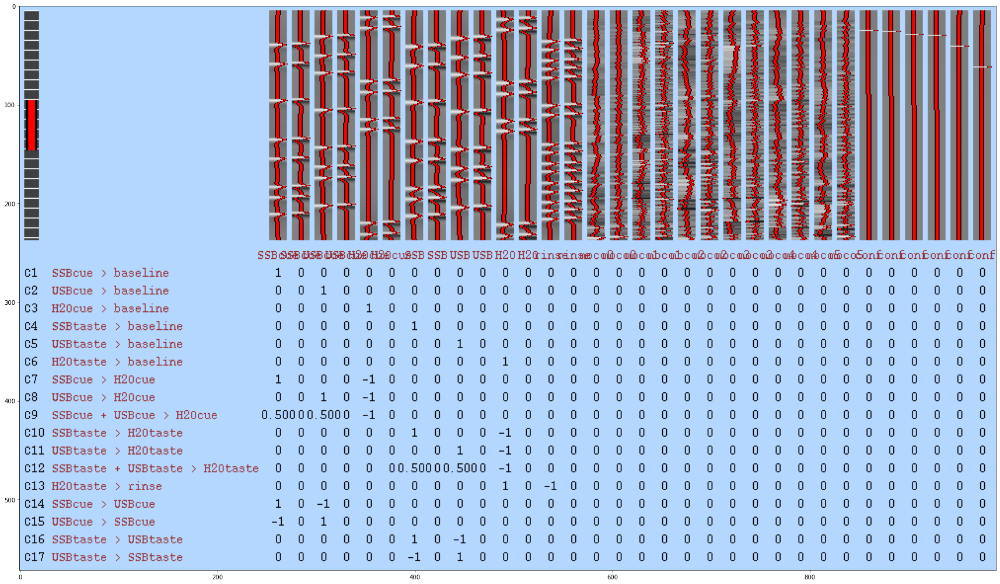

In [4]:
plt.figure(figsize=(30,20))
img=mpimg.imread('/projects/niblab/experiments/bbx/data/preprocessed/sub-001/ses-1/func/Analysis/feat1/training_run-1.feat/design.png')
imgplot = plt.imshow(img)
plt.show()



Quick View of Functional Input:  
`sub-001_ses-1_task-training_run-1_space-MNI152NLin2009cAsym_desc-preproc_bold_brain.nii.gz`

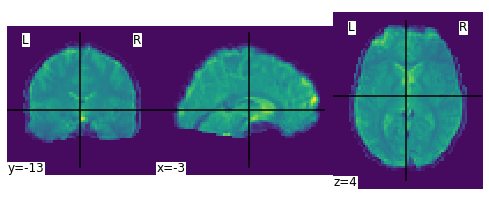

In [5]:
# view first volume of the input functional
nifti_example='/projects/niblab/experiments/bbx/data/preprocessed/sub-001/ses-1/func/sub-001_ses-1_task-training_run-1_space-MNI152NLin2009cAsym_desc-preproc_bold_brain.nii.gz'
first_vol=image.index_img(nifti_example, 0)
plotting.plot_img(first_vol)
                  
                  

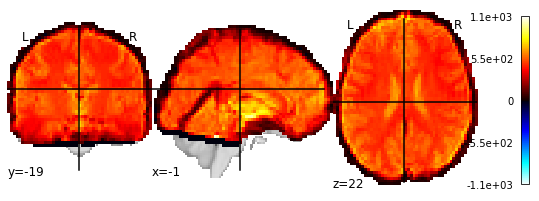

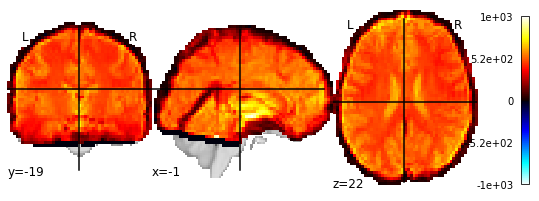

In [6]:
# plot multiple slices
selected_volumes = image.index_img(nifti_example, slice(3, 5))

for img in image.iter_img(selected_volumes):
    plotting.plot_stat_map(img)

In [7]:
# get files
file_path='/projects/niblab/experiments/bbx/data/preprocessed/sub-*/ses-1/func/Analysis/feat1/training_run-1.feat/reg'
functionals=glob.glob(os.path.join(file_path, "example_func2standard.png"))
len(functionals)

129

In [8]:
data_dict={}
for func_file in sorted(functionals):
    subject=func_file.split('/')[-8]
    if subject not in data_dict:
        data_dict[subject] = []
    data_dict[subject].append(func_file)
    



In [9]:
subjects=list(data_dict.keys())
len(subjects)

129

**View example_func2standard.png images for the fmriprep motion confound input feats:**

In [10]:

def plot(x=subjects[0]):
    for func_file in data_dict[x]:
        img = mpimg.imread(func_file)
        plt.imshow(img)
        plt.show()

w = widgets.Select(options=subjects)
interactive(plot, x=w)

interactive(children=(Select(description='x', options=('sub-001', 'sub-002', 'sub-003', 'sub-004', 'sub-005', …

In [11]:
# get files
fsl_file_path='/projects/niblab/experiments/bbx/data/preprocessed/sub-*/ses-1/func/Analysis/feat1/training_run-1_fsl.feat/reg'
functionals_fsl=glob.glob(os.path.join(fsl_file_path, "example_func2standard.png"))
len(functionals_fsl)

129

In [12]:
fsl_data_dict={}
for func_file in sorted(functionals_fsl):
    subject=func_file.split('/')[-8]
    if subject not in fsl_data_dict:
        fsl_data_dict[subject] = []
    fsl_data_dict[subject].append(func_file)
    



In [13]:
subjects=list(fsl_data_dict.keys())
len(subjects)

129

**View example_func2standard.png images for the feats with fsl confound input:**

In [14]:

def fsloutput_plot(x=subjects[0]):
    for func_file in fsl_data_dict[x]:
        img = mpimg.imread(func_file)
        plt.imshow(img)
        plt.show()

w = widgets.Select(options=subjects)
interactive(fsloutput_plot, x=w)

interactive(children=(Select(description='x', options=('sub-001', 'sub-002', 'sub-003', 'sub-004', 'sub-005', …

### Feat2   <a class='anchor' id='feat2'></a>  
Design file: `/projects/niblab/experiments/bbx/data/code/design2.fsf`

### Feat3 <a class='anchor' id='feat3'></a>  
Design file: `/projects/niblab/experiments/bbx/data/code/design3_129.fsf `

In [1]:
from nilearn import datasets

# haxby dataset to have EPI images and masks
haxby_dataset = datasets.fetch_haxby()

# print basic information on the dataset
print('First subject anatomical nifti image (3D) is at: %s' %
      haxby_dataset.anat[0])
print('First subject functional nifti image (4D) is at: %s' %
      haxby_dataset.func[0])  # 4D data

haxby_anat_filename = haxby_dataset.anat[0]
haxby_mask_filename = haxby_dataset.mask_vt[0]
haxby_func_filename = haxby_dataset.func[0]

# one motor contrast map from NeuroVault
motor_images = datasets.fetch_neurovault_motor_task()
stat_img = motor_images.images[0]


Dataset created in /home/nbytes/nilearn_data/haxby2001



Downloaded 2969 of 2969 bytes (100.0%,    0.0s remaining) ...done. (0 seconds, 0 min)


Downloaded 408 of 408 bytes (100.0%,    0.0s remaining) ...done. (0 seconds, 0 min)


Downloaded 291168628 of 291168628 bytes (100.0%,    0.0s remaining) ...done. (4 seconds, 0 min)
Extracting data from /home/nbytes/nilearn_data/haxby2001/f33ff337e914bf7fded743c7107979f9/subj2-2010.01.14.tar.gz..... done.


First subject anatomical nifti image (3D) is at: /home/nbytes/nilearn_data/haxby2001/subj2/anat.nii.gz
First subject functional nifti image (4D) is at: /home/nbytes/nilearn_data/haxby2001/subj2/bold.nii.gz

Dataset created in /home/nbytes/nilearn_data/neurovault



In [2]:
stat_img

'/home/nbytes/nilearn_data/neurovault/collection_658/image_10426.nii.gz'